<h2 align="center">INF575 - Fuzzy Logic</h2>
<h1 align="center">Segmentation of HER2 Overexpression in Histopathology Images with Fuzzy Decision Tree<h1>
    
<center>
    <img src="https://rochepacientes.es/content/dam/roche-pacientes-2/es/assets/images/que-es-her2.jpg" width="60%"/>
</center>

<h2 align="center">Data Exploration</h2>

<center>
<i> Sebastián Bórquez G. - <a href="mailto://sebastian.borquez.g@gmail.com">sebastian.borquez.g@gmail.com</a> - DI UTFSM - August 2020.</i>
</center>


In [1]:
%cd ..

/mnt/d/sebas/Desktop/her2_FL


In [2]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns; sns.set(palette="muted")
from IPython.display import display, HTML

from load_features import *

In [32]:
features_csv_files = [
    "./data/1+_2.csv",
    "./data/1+_20.csv",
    "./data/2+_1.csv",
    "./data/2+_8.csv",
    "./data/3+_16.csv",
    "./data/3+_19.csv",
]

test_csv_files = [
    "./data/1+_25.csv",
    "./data/2+_9.csv",
    "./data/3+_15.csv",
]

## Load Features

In [33]:
features_list = [load_features(csv_file) for csv_file in features_csv_files]
features = merge_features(features_list)
del features_list

## Prepare Data

In [34]:
(features_names, target_col), (X, y) = split_features_target(features)

In [35]:
print("Target", target_col)
print("Features:", len(features_names), end="\n\t")
print(*features_names, sep="\n\t")

Target Class
Features: 24
	mean_rawbred
	mean_exgreen
	mean_vertical
	mean_hematoxylin
	mean_horizontal
	energy_horizontal
	mean_rawblue
	mean_intentsity
	sobel_magnitud
	mean_exblue
	correlation_horizontal
	mean_hue
	mean_eosin
	mean_dab
	lpb_ror
	homogeneity_vertical
	laplacian
	correlation_vertical
	energy_vertical
	homogeneity_horizontal
	mean_saturation
	mean_rawgreen
	mean_value
	mean_exred


## Explore

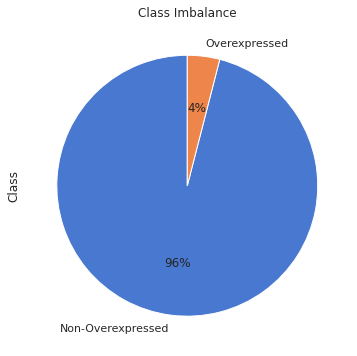

In [36]:
plt.figure(figsize=(6,6))
plt.title("Class Imbalance")
features["Class"]\
    .value_counts(normalize=True)\
    .plot.pie(autopct='%1.0f%%', startangle=90, labels=["Non-Overexpressed", "Overexpressed"]);

In [37]:
features.image.unique()

array(['1+_2.tif', '1+_20.tif', '2+_1.tif', '2+_8.tif', '3+_16.tif',
       '3+_19.tif'], dtype=object)

In [38]:
show_images = np.random.choice(features.image.unique(), 3, replace=False)
show_images

array(['3+_16.tif', '2+_1.tif', '1+_20.tif'], dtype=object)

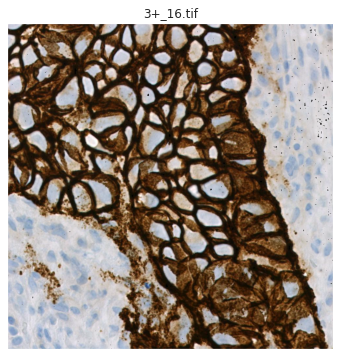

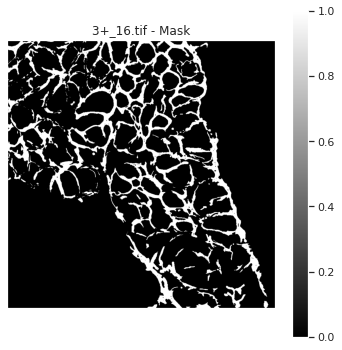

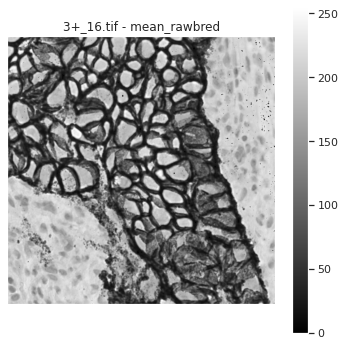

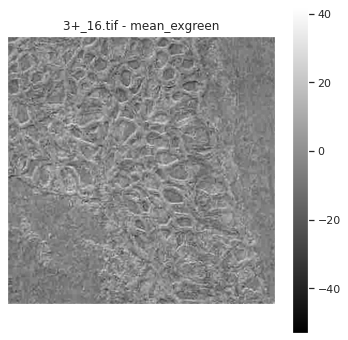

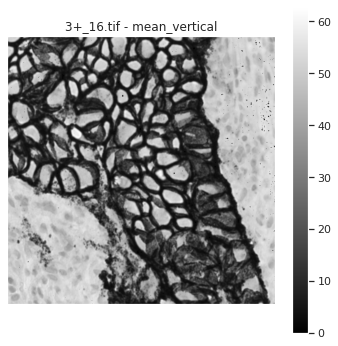

...

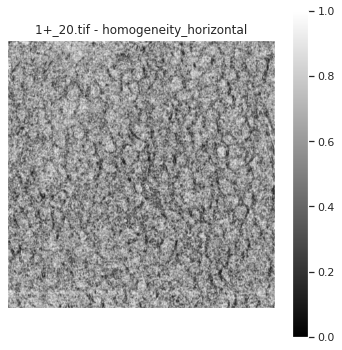

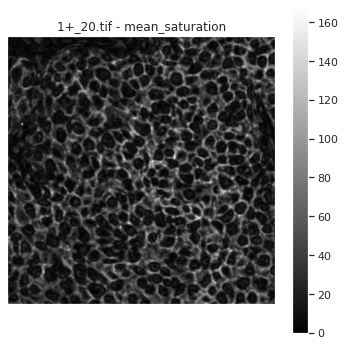

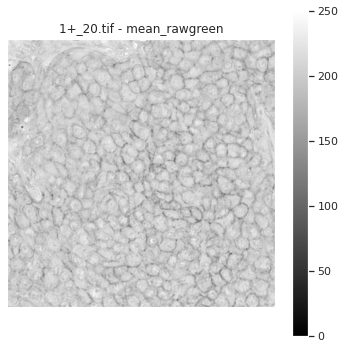

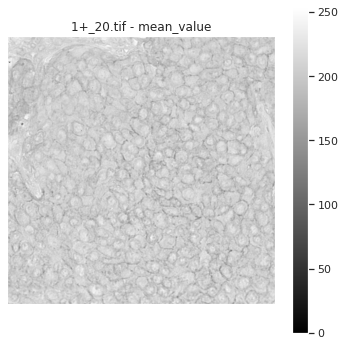

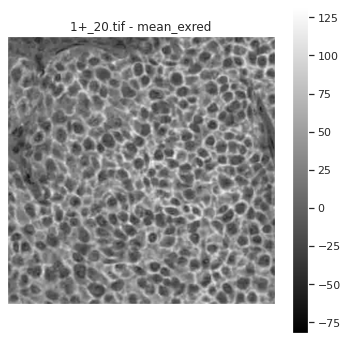

In [39]:
for image_name in show_images:
    display(HTML(f"<center><h3>{image_name}</h3></center>"))
    show_image_and_features(image_name, features, features_names)